In [ ]:
!pip install pandas, matplotlib, seaborn, sklearn, numpy

In [15]:
from pandas import read_csv
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [16]:
from sklearn.model_selection import train_test_split
import numpy as np

# Przykładowe modele i zbiory danych

## 1. Linear Regression / Regresja liniowa

In [17]:
from sklearn.linear_model import LinearRegression

### 1.1. Jednej zmiennej

In [18]:
# Ładuje zbiór danych
data = read_csv("dataset/weight-height.csv")
data.columns = ['Gender', 'Weight', 'Height']

In [19]:
# Umieszczam kolumny w zmiennych
idx = data["Gender"] == "Male"
height = data["Height"]
weight = data["Weight"]

In [20]:
# miejsce na stałe
LIMIT = 1000

Text(0.5, 1.0, 'ALL')

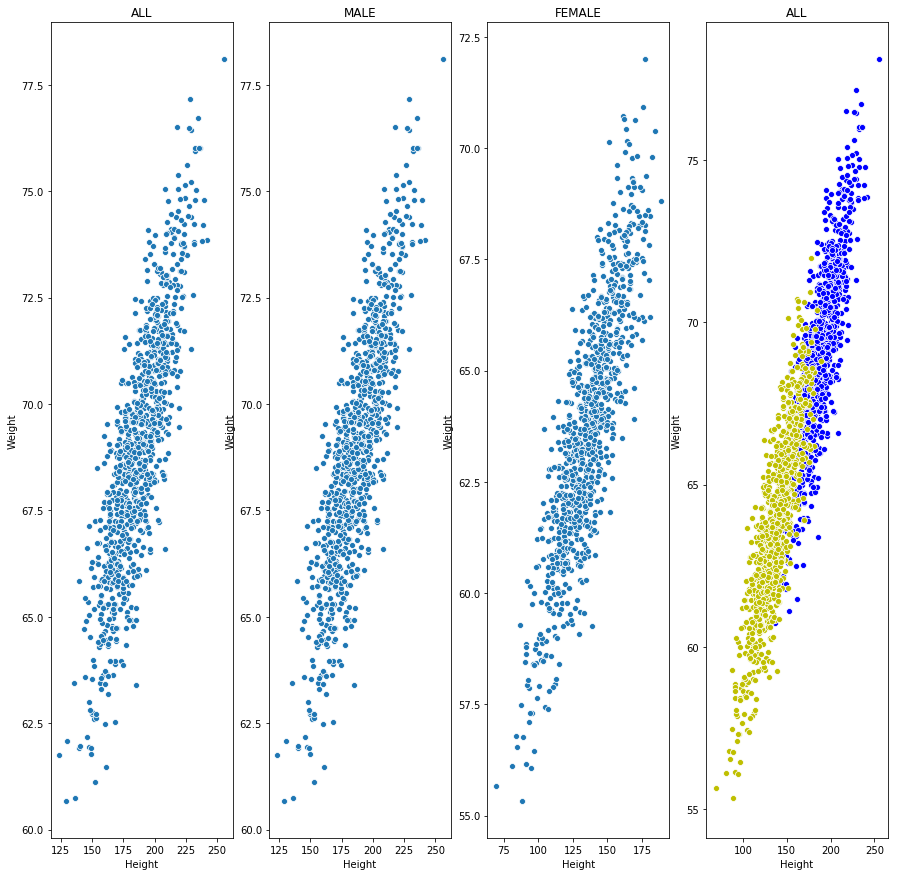

In [21]:
# Przedstawiam dane
plt.figure(figsize=[15,15])
plt.subplot(141)
sns.scatterplot(height[:LIMIT], weight[:LIMIT], )
plt.title("ALL")
plt.subplot(142)
sns.scatterplot(height[idx][:LIMIT], weight[idx][:LIMIT])
plt.title("MALE")
plt.subplot(143)
sns.scatterplot(height[~idx][:LIMIT], weight[~idx][:LIMIT])
plt.title("FEMALE")
plt.subplot(144)
sns.scatterplot(height[idx][:LIMIT], weight[idx][:LIMIT], c=["b"])
sns.scatterplot(height[~idx][:LIMIT], weight[~idx][:LIMIT], c=["y"])
plt.title("ALL")

### $$X = Heights$$ 
### $$Y = Weights = f(X) = f(Heights)$$

### `X - zmienna objaśniająca / predyktor`<br>
### `Y - zmienna objaśniana`

#### Chcemy znaleźć wcześniejszą zależność $ Y = f(X)$, gdzie $f$ określa nam rodzaj zależności, lecz jedyne co możemy uzyskać to przybliżenie $f(X)$, oznaczane jako $\hat{f(X)}$, na podstawie dostarczanych nam danych.

#### Użyłem słowa przybliżenie potocznie, ale oddaje to formalny wymóg, by dla danych nam dostarczonych wartość $||\hat{f(X)}- f(X)||$ była jak najmniejsza, gdzie $||*||$ jest konkretnym rodzajem odległości [(norma)](https://en.wikipedia.org/wiki/Norm_(mathematics)), który ustala się w zależności od zadania.

#### Najprostszą funkcją o jakiej możemy pomyśleć, jest funkcja liniowa, poznajemy już ją w gimnazjum... 

#### ...teraz to nie wiem gdzie się ją spotyka.

#### Jest ona postaci:

## $$ f(X) = aX + b$$

gdzie $a,b \in R$

In [22]:
# Wsad do modelu liniowego
X = [[x] for x in height.values]
Y = weight.values

In [23]:
# Inicjalizuje obiekt i trenuje(dopasowuje)
linear_model = LinearRegression()
linear_model.fit(X, Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

## Miary dopasowania

## $ R^2$

In [24]:
linear_model.score(X, Y)

0.8551742120609958

## $||*||_{2}^2$ / $L_2^{2}$

In [25]:
def norm2(y, predicted_y):
    return sum((y-predicted_y)*(y-predicted_y))

In [26]:
norm2(Y, linear_model.predict(X))

21437.10196882942

### Czy to blisko? Czy może daleko?

Text(0, 0.5, 'Weight')

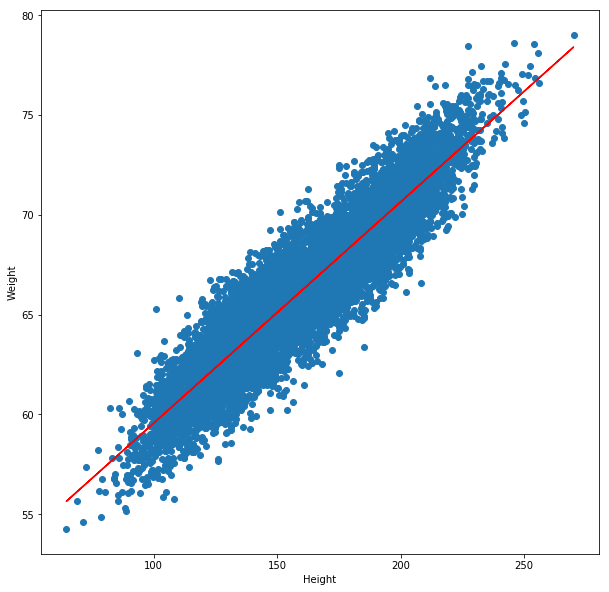

In [27]:
plt.figure(figsize=[10,10])
plt.scatter(X, Y)
plt.plot(X, linear_model.predict(X), "r")
plt.xlabel("Height")
plt.ylabel("Weight")

#### Czyli pasuje... (pózniej sobie sprawdzimy co kryje się pod algorytmem "dopasowywania")    .

#### ...ale nie o to chodzi by szukać prostej która dopasowywuje się do dostarczanego nam zbioru danych i na tym poprzestać.

#### W zadaniu z regresją chodzi o to, by znaleźć prostą wpasowywującą się w trend, mogącą służyć do predykcji danych jeszcze nie widzianych podczas jej "dopasowywania".

### Zbiór testowy i treningowy

#### Żeby to zrobić podzielimy zbiór $X$ na dwa zbiory:<br>
#### Treningowy - zbiór na którym stworzymy model<br>
#### Testowy - zbiór na którym ocenimy zdolność predykcji

#### Nie możemy tego zrobic jednak dowolnie, musi to byc proces losowy.

#### Mogłoby się stać tak że trenowalibysmy na osobach o niskiej wadze ale wysokich, a testowali na niskich ale o wadze wysokiej, wtedy otrzymalibyśmy potwornie złą ocene naszego klasyfikatora.

In [28]:
# Rozdzielam losowo
Xtr, Xte, Ytr, Yte = train_test_split(height, weight, test_size=0.3)

In [29]:
Xtr_ml = [[x] for x in Xtr]
Xte_ml = [[x] for x in Xte]

In [30]:
ml = LinearRegression().fit(Xtr_ml, Ytr)

Text(0, 0.5, 'Weight')

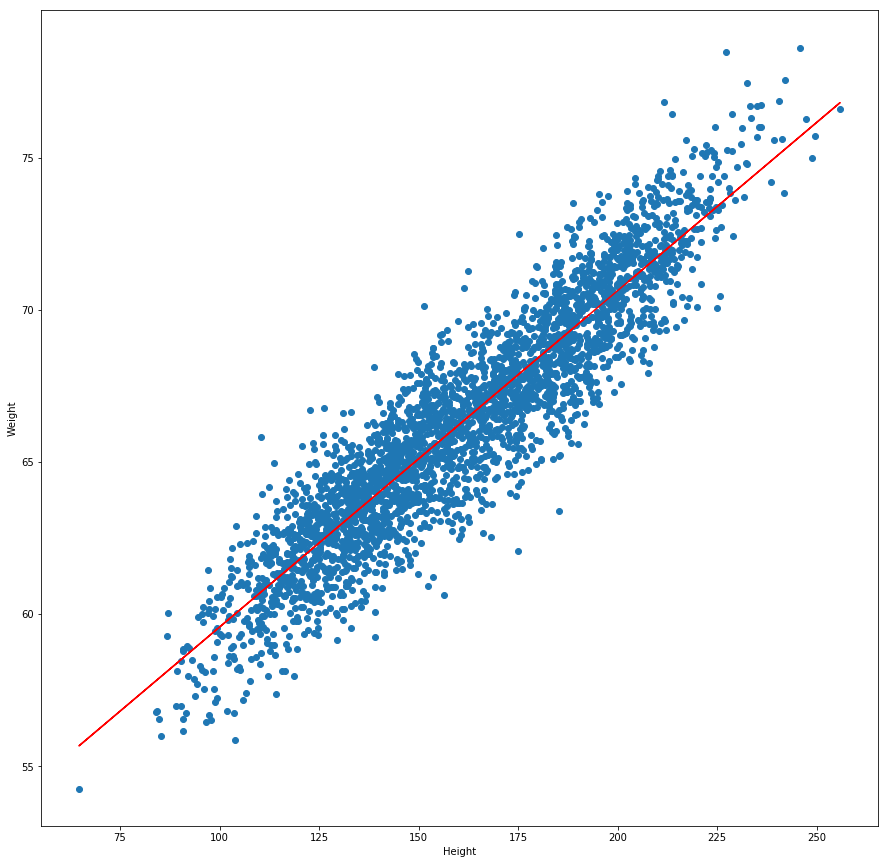

In [31]:
# Predykcja zbioru testowego na modelu wytrenowanym na zbiorze treningowym
plt.figure(figsize=[15,15])
plt.scatter(Xte, Yte)
plt.plot(Xte, ml.predict(Xte_ml), "r")
plt.xlabel("Height")
plt.ylabel("Weight")

### Underfitting / Niedoterenowanie

#### To zjawisko gdy model uczy się zbyt wolno(bardziej złożone modele), lub zbiór treningowy jest za mały.

#### Trenując na zbiorze za małym możemy nie sprawić że model nauczy się danej cechy, tak samo jak nie nauczymy się za duzo o jakiejkolwiek rzeczy widząc ją np 3 razy

#### Dając dwu elementowy zbiór treningowy dostajemy prostą przechodzącą dokładnie przez te dwa punkty.

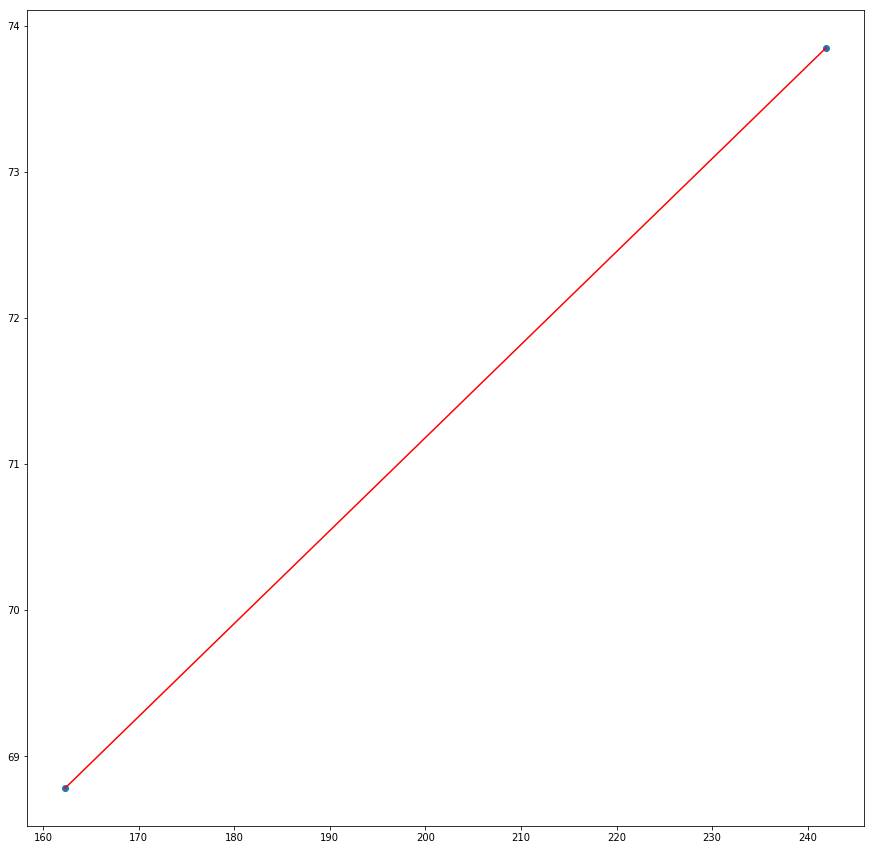

In [32]:
plt.figure(figsize=[15,15])
plt.scatter(X[:2], Y[:2])
ml = LinearRegression().fit(X[:2], Y[:2])
plt.plot(X[:2], ml.predict(X[:2]), "r")

A to prosta, nie za dobrze przewiduje trend.

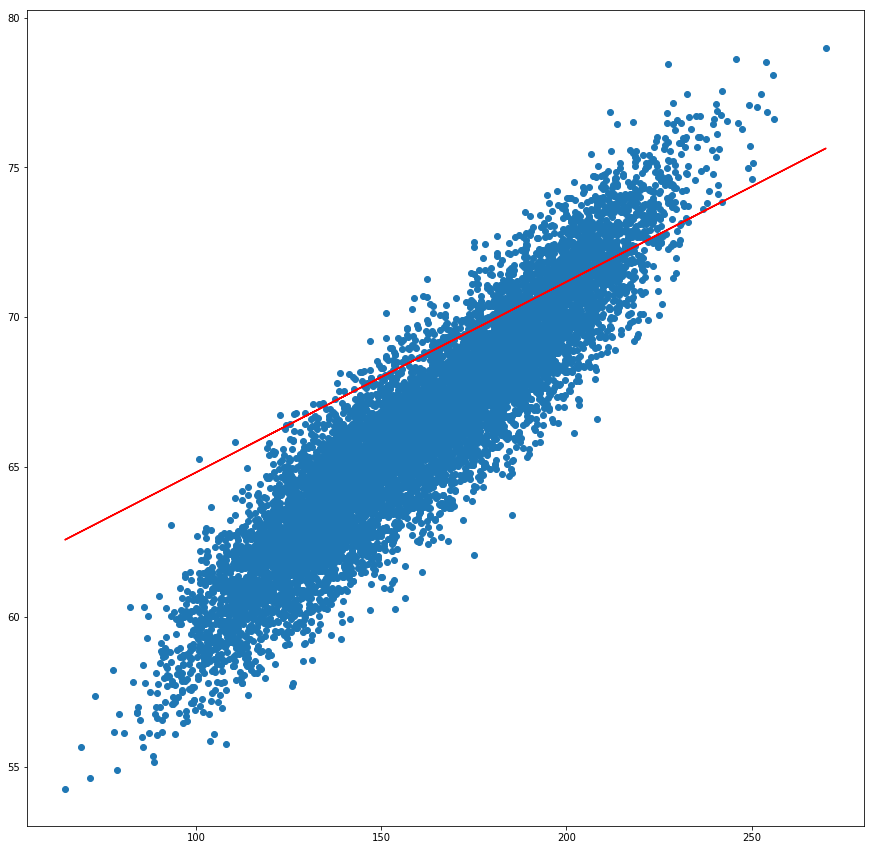

In [33]:
plt.figure(figsize=[15,15])
plt.scatter(X, Y)
plt.plot(X, ml.predict(X), "r")

Spróbujmy nauczyć model na coraz większych zbiorach punktów

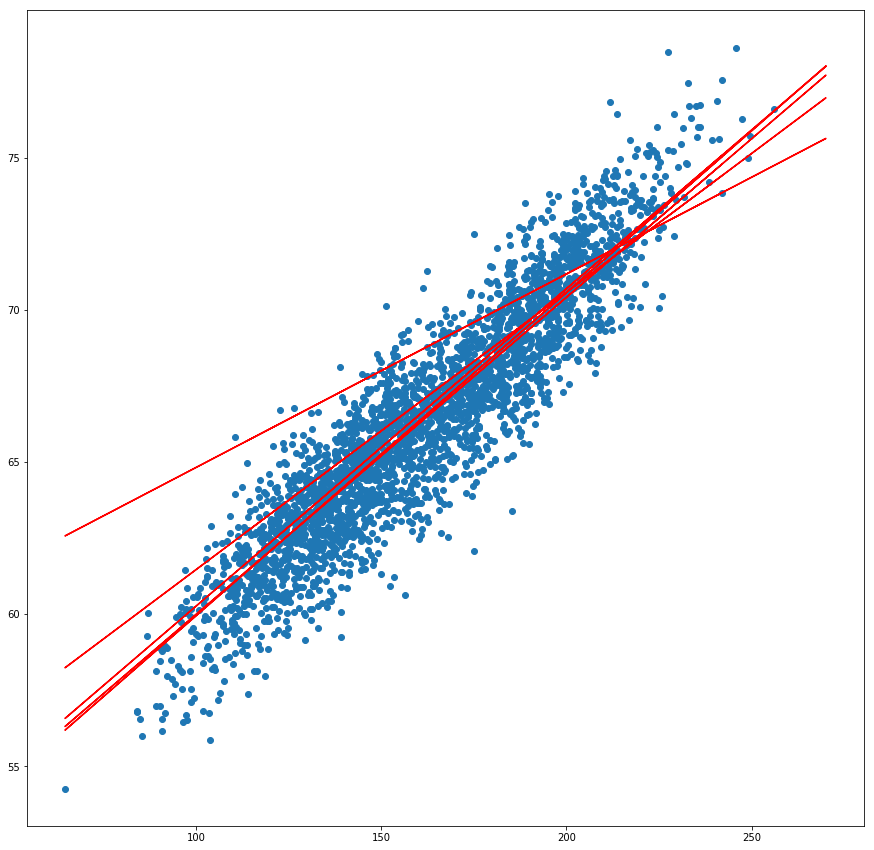

In [34]:
plt.figure(figsize=[15,15])
plt.scatter(Xte, Yte)
for i in range(2, 50, 10):
    ml = LinearRegression().fit(X[:i], Y[:i])
    plt.plot(X, ml.predict(X), "r", label=i)
    

#### Widzimy że wraz z wielkością zbioru treningowego polepsza się klasyfikacja.

### Overfitting / Przetrenowanie

#### To zjawisko gdy model nadmiernie dopasowuje się do danych treningowych, dając okropne rezultaty w postaci predykcji, mimo że dane treningowe i testowe zostały dobrane losowo.

#### Możemy to ująć też tak:

#### Model znacznie gorzej klasyfikuje na zbiorze testowym, niż na treningowym.

#### Dwie główne powody przetrenowania to:<br>
#### 1) Model ma za dużo parametrów od siebie niezależnych<br>
#### 2) Model uczy się za długo<br>
#### 3) Zbiór danych jest niezbalansowany

#### Pokazemy to sobie na sieciach neuronowych pózniej :)

## Gdzie liniowa regresja zawodzi?

In [35]:
# Tworzę dane syntetyczne
X_mlr = range(-100, 100)
y_mlr = [x**2 for x in X_mlr]

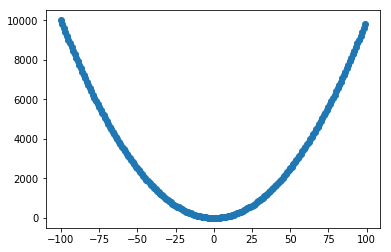

In [36]:
# Plotuje stworzone dane syntetyczne
plt.scatter(X_mlr, y_mlr)

In [37]:
# Rozdzielam te dane losowo
Xtr, Xte, Ytr, Yte = train_test_split(X_mlr, y_mlr, test_size=0.3)

In [38]:
# Wsad do modelu
Xtr = [[x] for x in Xtr]
Xte = [[x] for x in Xte]

In [39]:
# Trenuje model
mlm = LinearRegression()
mlm.fit(Xtr, Ytr)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

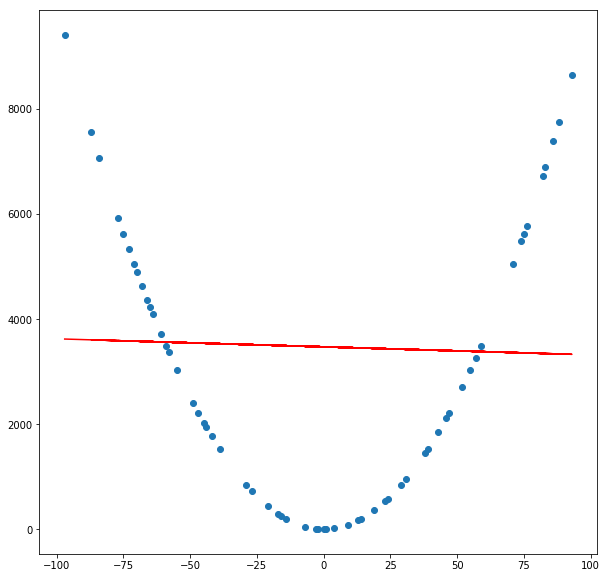

In [40]:
plt.figure(figsize=[10,10])
plt.scatter(Xte, Yte)
plt.plot(Xte, mlm.predict(Xte), "r")

Nie ważne co byśmy robili, model nie dopasuje się do danych, bo postawiliśmy hipoteze ze dane mają charakter liniowy.

### 1.2 Wielu zmiennych

In [41]:
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
from sklearn.datasets import load_boston

W tym przypadku nie jest to szukanie prostej dopasowujacej sie do danych na dwuwymiarowej plaszczyznie, ale w ogólności szukanie płaszczyzny wymiaru $n-1$ zanurzonej w przestrzeni wymiaru $n$

W przypadku n=2 szukaliśmy płaszczyny jednowymiarowej (prostej), w przestrzeni wymiaru 2(płaszczyzny)

In [42]:
# ładuje przykładowe dane
data = load_boston()

X = data.data[:,4:6]
y = data.target

In [43]:
# Rozdzielam dane na treningowe i testowe
Xtr, Xte, Ytr, Yte = train_test_split(X, y, test_size=0.3)

In [44]:
# Rozdzielam predyktory
x_axis, y_axis = zip(*X)

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


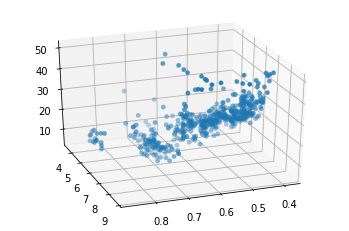

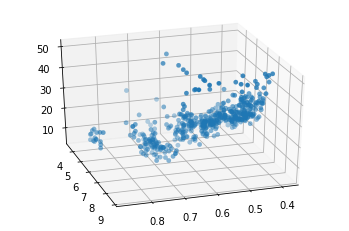

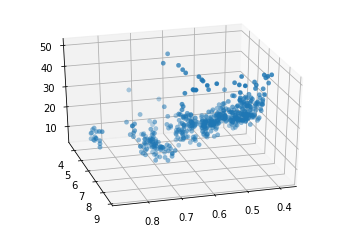

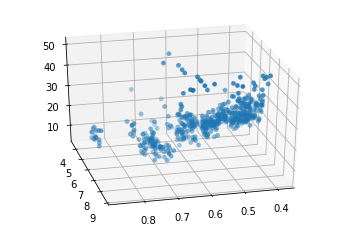

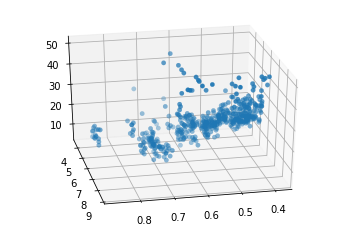

...

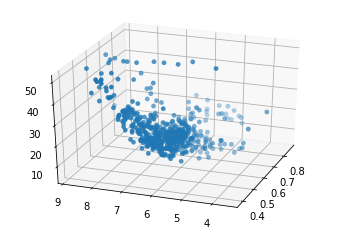

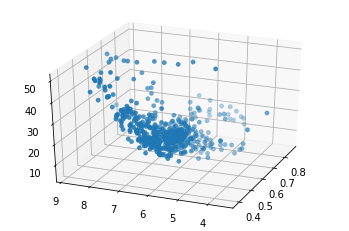

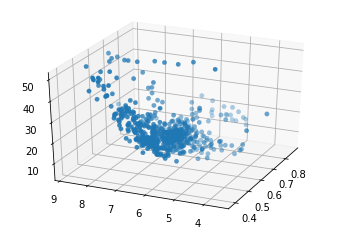

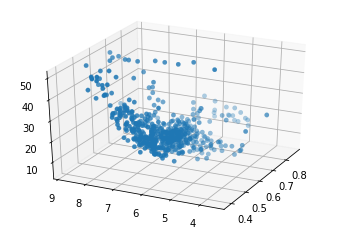

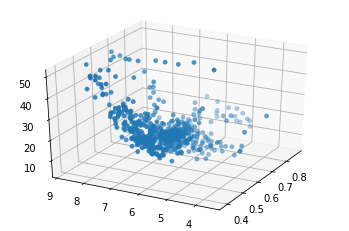

In [45]:
# tworze migawki do animacji, a następnie tworzę animację z punktów
for angle in range(70,210,2):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.scatter3D(x_axis, y_axis, y, cmap=plt.cm.viridis, linewidth=0.2)
    ax.view_init(30,angle)
    filename='animation/scatter_step'+str(angle)+'.png'
    plt.savefig(filename, dpi=96)
    
!convert -delay 50 animation/scatter_step*.png animated_points.gif

In [46]:
# trenuje model
mlm = LinearRegression()
mlm.fit(Xtr,Ytr)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [47]:
# rozdzielam predyktory dla danych testowych
x_axis_te, y_axis_te = zip(*Xte)

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memo

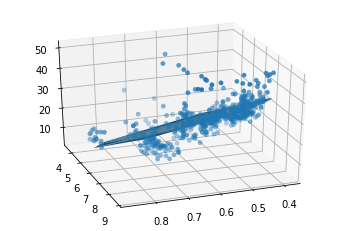

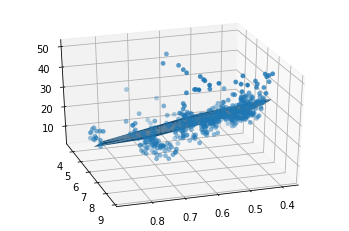

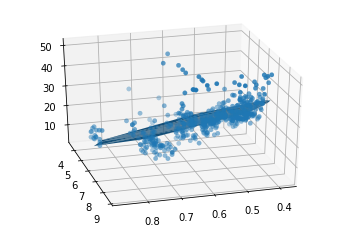

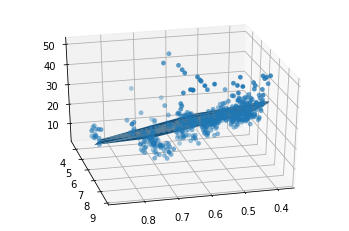

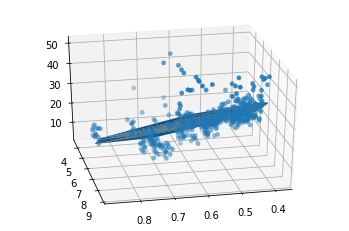

...

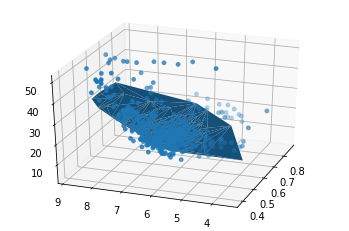

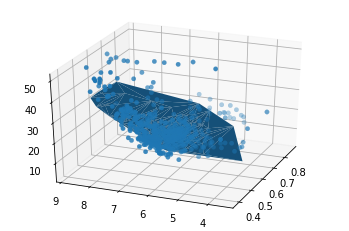

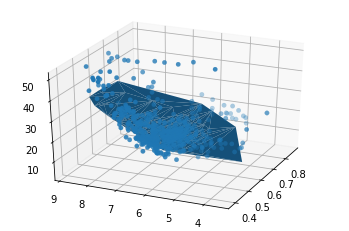

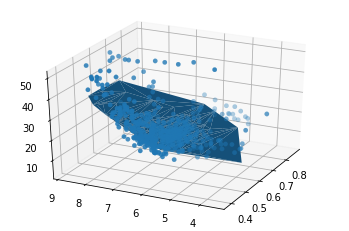

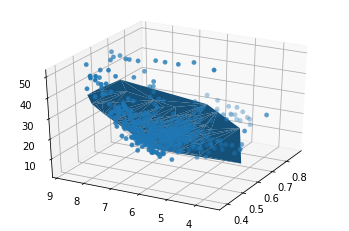

In [48]:
# tworze migawki do animacji, a następnie tworzę animację z punktów i plaszczyzny dopasowanej
for angle in range(70,210,2):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.scatter3D(x_axis, y_axis, y, cmap=plt.cm.viridis, linewidth=0.2)
    ax.plot_trisurf(x_axis_te, y_axis_te, mlm.predict(Xte))
    ax.view_init(30,angle)
    filename='animation/scatter_with_line_step'+str(angle)+'.png'
    plt.savefig(filename, dpi=96)
    
!convert -delay 50 animation/scatter_with_line_step*.png animated_points_with_fitted_line.gif

## $R^2$

In [49]:
mlm.score(Xte, Yte)

0.6100045005737514

## 2. Decision Trees

In [50]:
from sklearn.tree import DecisionTreeClassifier

In [52]:
data1 = np.random.random(size=(50,2)) * [50, 50]
data2 = np.random.random(size=(50,2)) * [50, 50] + [100, 1]
data3 = np.random.random(size=(50,2)) * [50, 50] + [1, 100]
data4 = np.random.random(size=(50,2)) * [50, 50] + [100, 100]

In [53]:
x1, y1 = zip(*data1)
x2, y2 = zip(*data2)
x3, y3 = zip(*data3)
x4, y4 = zip(*data4)

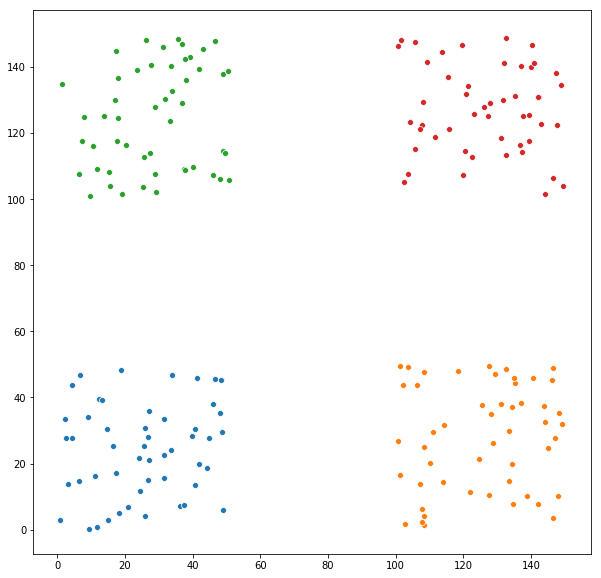

In [54]:
plt.figure(figsize=(10,10))
sns.scatterplot(x1, y1)
sns.scatterplot(x2, y2)
sns.scatterplot(x3, y3)
sns.scatterplot(x4, y4)

In [55]:
X = np.concatenate((data1, data2, data3, data4))
y = [1] * 50 + [3] * 50 + [4] * 50 + [2] * 50

In [56]:
dtc = DecisionTreeClassifier(criterion="gini")

In [57]:
# Rozdzielam dane na treningowe i testowe
Xtr, Xte, Ytr, Yte = train_test_split(X, y, test_size=0.3)

In [58]:
dtc.fit(Xtr, Ytr)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

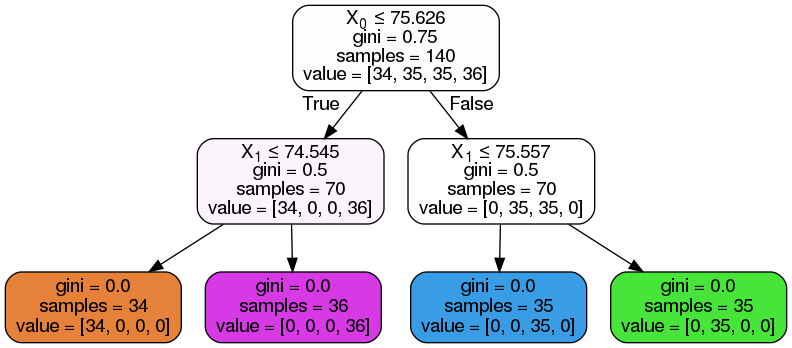

In [59]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [60]:
dtc.score(Xte, Yte)

1.0

#### Zobaczmy jak bardzo źle dopasowuje się do tego zadania regresja liniowa dla dwóch predyktorów

In [61]:
# Inicjalizuje obiekt i trenuje(dopasowuje)
linear_model = LinearRegression()
linear_model.fit(Xtr, Ytr)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [62]:
linear_model.score(Xte, Yte)

0.2011260278847764

In [63]:
x_axis, y_axis = zip(*X)
# rozdzielam predyktory dla danych testowych
x_axis_te, y_axis_te = zip(*Xte)

/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/usr/local/lib/python3.6/dist-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memo

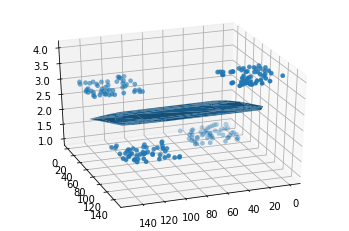

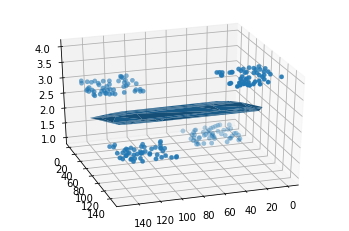

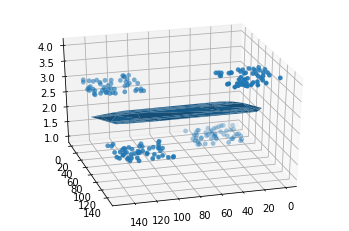

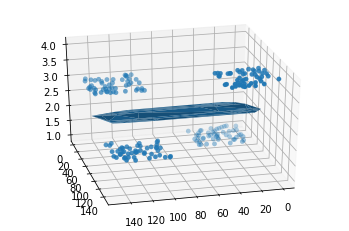

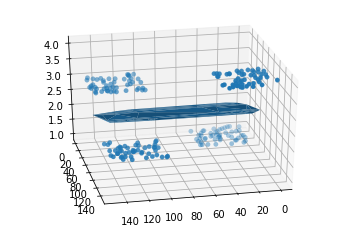

...

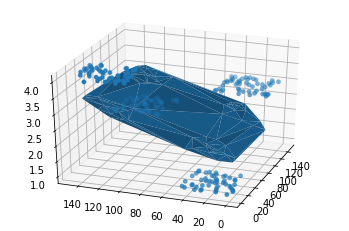

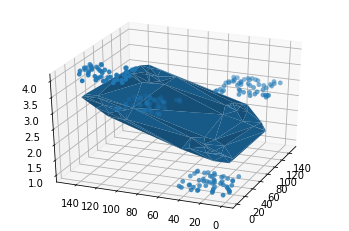

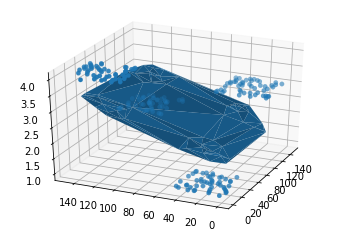

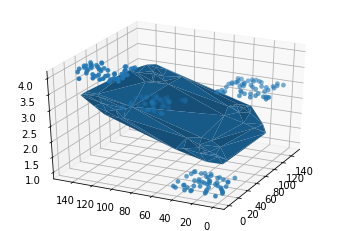

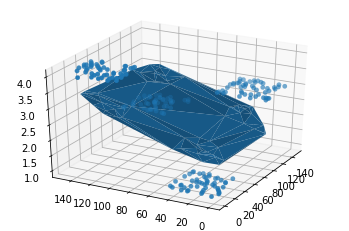

In [64]:
# tworze migawki do animacji, a następnie tworzę animację z punktów i plaszczyzny dopasowanej
for angle in range(70,210,2):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.scatter3D(x_axis, y_axis, y, cmap=plt.cm.viridis, linewidth=0.2)
    ax.plot_trisurf(x_axis_te, y_axis_te, linear_model.predict(Xte))
    ax.view_init(30, angle)
    filename='animation/dtc_scatter_with_line_step'+str(angle)+'.png'
    plt.savefig(filename, dpi=96)
    
!convert -delay 50 animation/dtc_scatter_with_line_step*.png dtc_animated_points_with_fitted_line.gif

In [65]:
linear_model.score(Xte, Yte)

0.2011260278847764

### Weźmy jakiś trudniejszy zbiór dla klasyfikacji, który ma wiecej niz 2 predyktory

In [66]:
iris = sns.load_dataset('iris')

In [67]:
iris.sample(frac=1/10)

,sepal_length,sepal_width,petal_length,petal_width,species
48,5.3,3.7,1.5,0.2,setosa
27,5.2,3.5,1.5,0.2,setosa
134,6.1,2.6,5.6,1.4,virginica
105,7.6,3.0,6.6,2.1,virginica
95,5.7,3.0,4.2,1.2,versicolor
139,6.9,3.1,5.4,2.1,virginica
82,5.8,2.7,3.9,1.2,versicolor
89,5.5,2.5,4.0,1.3,versicolor
133,6.3,2.8,5.1,1.5,virginica
137,6.4,3.1,5.5,1.8,virginica


In [68]:
iris["species"].unique()

array(['setosa', 'versicolor', 'virginica'], dtype=object)

In [69]:
X, y = iris.values[:, :-1], iris.values[:, -1]

In [70]:
# Rozdzielam losowo
Xtr, Xte, Ytr, Yte = train_test_split(X, y, test_size=0.3)

In [71]:
dtc = DecisionTreeClassifier(criterion="gini")

In [72]:
dtc.fit(Xtr, Ytr)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [73]:
dtc.score(Xte, Yte)

0.9777777777777777

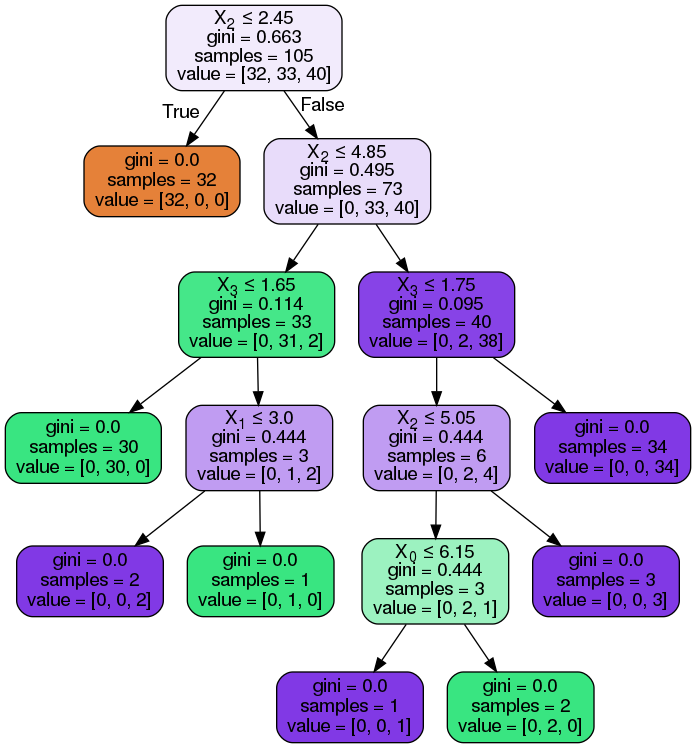

In [74]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# 3. SVM

In [75]:
from IPython.display import Image
from sklearn.datasets.samples_generator import make_blobs

W części drugiej mieliśmy do czynienia z problemem klasyfikacji w którym szatkowało się płaszczyzne za pomocą drzewa decyzyjnego na rozłączne pola.
Szatkowanie wyznaczane było przez wartość w węźle decyzyjnym. Każda z otrzymanych pól, oznaczała jaką klase.

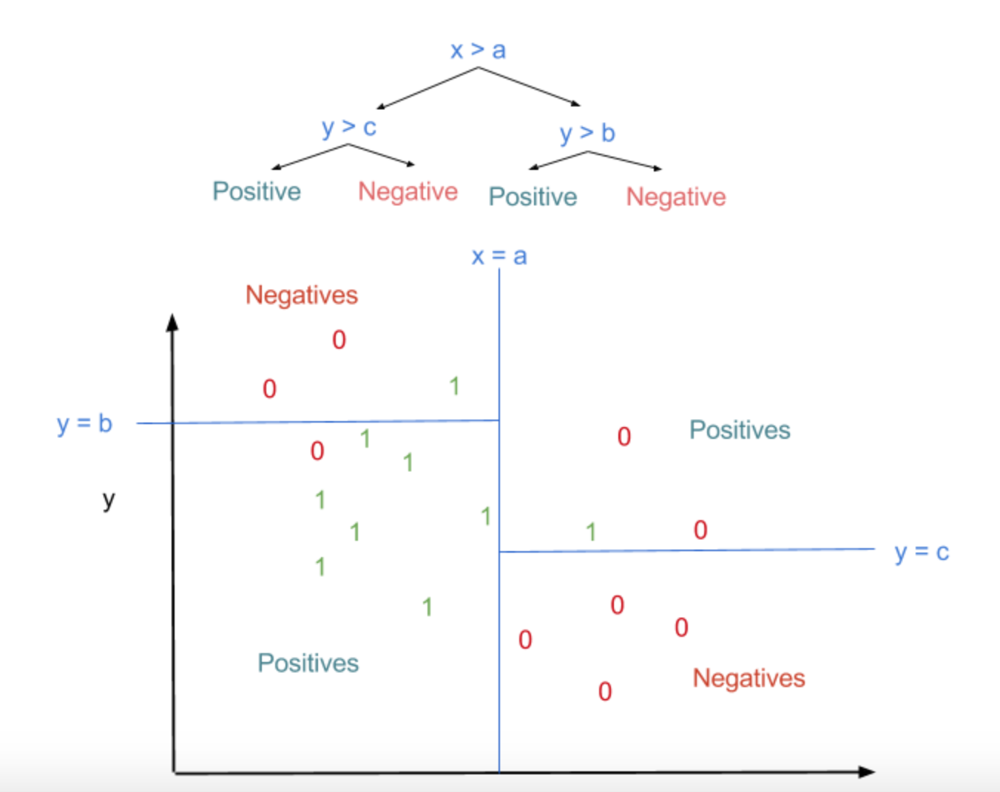

In [77]:
Image("section.png", width=500)

W podejściu(SVM) określa się linie decyzyjną, maksymalizując tak zwany margines, który ogranicza klasy punktów. Dla uproszecznia weźmy binarny problem klasyfikacji(czyli obiekt moze byc przypisany jednej z dwóch klas).


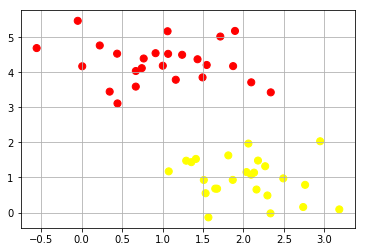

In [202]:
X, y = make_blobs(n_samples=50, centers=2,
                  random_state=0, cluster_std=0.60)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plt.grid(True)

Możemy dany zbiór punktów rozdzielić linią i dawałaby ona podział przestrzeni na dwie klasy

Lini takich możemy jednak wybrać wiele.

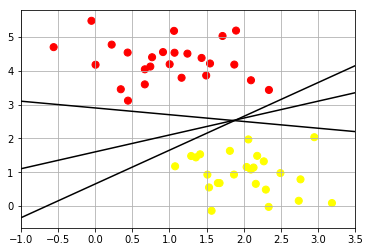

In [154]:
xfit = np.linspace(-1, 3.5)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')

for m, b in [(1, 0.65), (0.5, 1.6), (-0.2, 2.9)]:
    plt.plot(xfit, m * xfit + b, '-k')

plt.xlim(-1, 3.5)
plt.grid(True)

Jednak dodanie nowego punktu między te linie, może skutkować różną klasyfikacją w zależności od ustalenia lini.

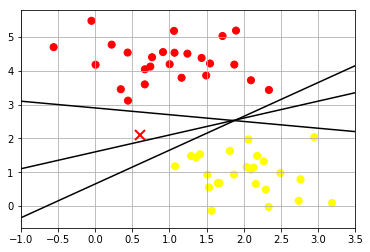

In [155]:
xfit = np.linspace(-1, 3.5)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plt.plot([0.6], [2.1], 'x', color='red', markeredgewidth=2, markersize=10)

for m, b in [(1, 0.65), (0.5, 1.6), (-0.2, 2.9)]:
    plt.plot(xfit, m * xfit + b, '-k')

plt.xlim(-1, 3.5)
plt.grid(True)

Problemem jak widzimy jest wybór lini, rozdzielającej klasy.

Radzimy sobie z tym twierdząc że najlepszą jest ta która daje najwięcej "luzu" między dwoma klasami

(-1, 3.5)

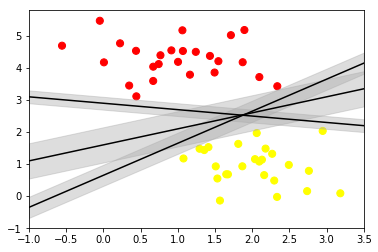

In [156]:
xfit = np.linspace(-1, 3.5)
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')

for m, b, d in [(1, 0.65, 0.33), (0.5, 1.6, 0.55), (-0.2, 2.9, 0.2)]:
    yfit = m * xfit + b
    plt.plot(xfit, yfit, '-k')
    plt.fill_between(xfit, yfit - d, yfit + d, edgecolor='none',
                     color='#AAAAAA', alpha=0.4)

plt.xlim(-1, 3.5)

Wybranie takiej lini jest czymś czym zajmiemy się pózniej podczas implementacji tego algorytmu.

Teraz zapoznajmy się z konceptem

In [157]:
from sklearn.svm import SVC # "Support vector classifier"
model = SVC(kernel='linear', C=1E10)
model.fit(X, y)

SVC(C=10000000000.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

Biblioteka ta nie posiada opcji wyplotowania wyniku w postaci lini i marginesów ją rozdzielających, dlatego musimy ją napisać sami.

In [159]:
def plot_svc_decision_function(model, ax=None, plot_support=True):
    if ax is None:
        ax = plt.gca()
    xlim = ax.get_xlim()
    ylim = ax.get_ylim()
    
    # create grid to evaluate model
    x = np.linspace(xlim[0], xlim[1], 30)
    y = np.linspace(ylim[0], ylim[1], 30)
    Y, X = np.meshgrid(y, x)
    xy = np.vstack([X.ravel(), Y.ravel()]).T
    P = model.decision_function(xy).reshape(X.shape)
    
    # plot decision boundary and margins
    ax.contour(X, Y, P, colors='k',
               levels=[-1,0, 1], alpha=0.5,
               linestyles=['--', '-', '--'])
    
    # plot support vectors
    if plot_support:
        ax.scatter(model.support_vectors_[:, 0],
                   model.support_vectors_[:, 1],
                   s=300, linewidth=1, facecolors='none');
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)

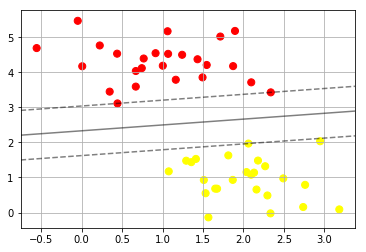

In [160]:
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plot_svc_decision_function(model)
plt.grid()

Punkty dotykające marginesu nazwane są wektorami wspierającymi(support vectors) i to od nich bierzę się nazwa tego algorytmu (Support Vectors Machine)

Są one kluczowe i tylko one są ważne dla algorytmu.

Są nawet zapisane w modelu

In [141]:
model.support_vectors_

array([[0.44359863, 3.11530945],
       [2.33812285, 3.43116792],
       [2.06156753, 1.96918596]])

Jest to jednak bardzo prosta i wręcz życzeniowa sytuacja, gdy dwie grupy punktów mogą być bez problemu rozgraniczone linią.

Co z sytuacjami gdy jedna grupa jest otoczona przez drugą

### Kernels

Rozpatrzmy nowy zbiór danych, a następnie pokażmy siłe rozszerzenia tradycyjnego SVM

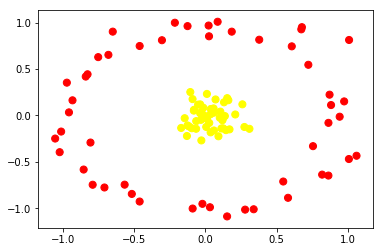

In [161]:
from sklearn.datasets.samples_generator import make_circles
X, y = make_circles(100, factor=.1, noise=.1)

clf = SVC(kernel='linear').fit(X, y)

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plt.grid()

Stosując podstawowe SVM nie jesteśmy w stanie prostą rozgraniczyć tych dwóch grup punktów.

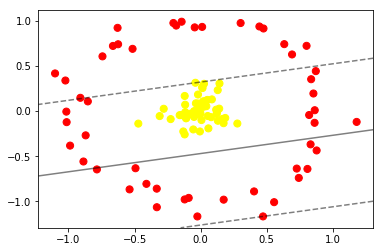

In [162]:
from sklearn.datasets.samples_generator import make_circles
X, y = make_circles(100, factor=.1, noise=.1)

clf = SVC(kernel='linear').fit(X, y)

plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plot_svc_decision_function(clf, plot_support=False)
plt.grid()

Z pomocą przychodzi tu nam pomysł wykorzysania jądra(kernel)

Jest to przekształcenie które służy nam do przeniesienia starej przestrzeni, w nową, gdzie rozgraniczenie płaszczyzną bedzie możliwe

Na przykład moglibyśmy dwuwymiarową płaszczyzne traktować jako trzywymiarową, ale wszystkie punkty mają trzecią zmienną równą 0.

Wtedy mozemy przenieść punkty ze środka okręgu na wyzszy poziom zmiennej z.

Zrobimy to używając tak zwanej funkcji radialnej

In [166]:
r = np.exp(-(X ** 2).sum(1))

In [167]:
from ipywidgets import interact, fixed

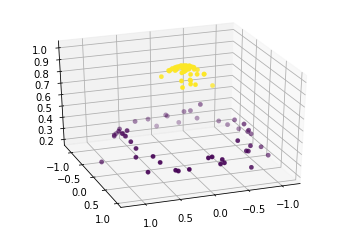

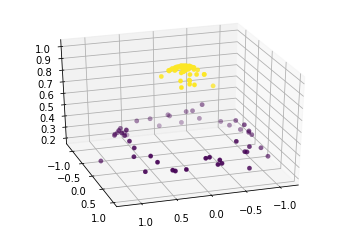

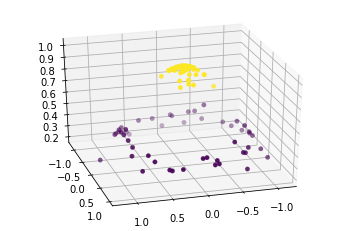

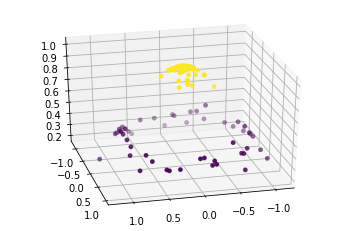

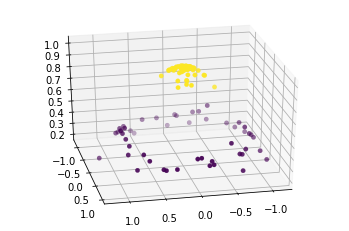

...

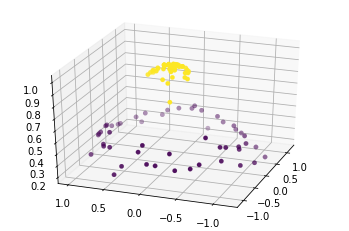

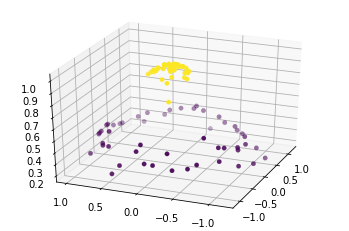

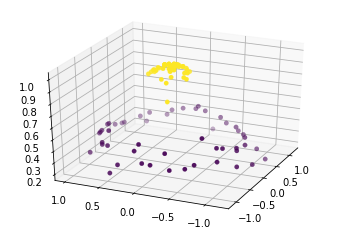

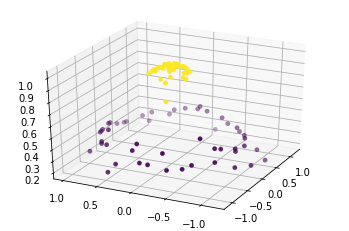

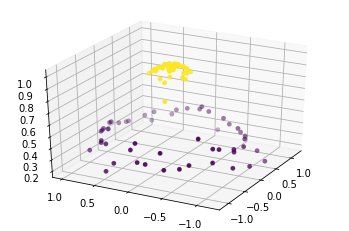

In [179]:
for angle in range(70,210,2):
    fig = plt.figure()
    ax = fig.gca(projection='3d')
    ax.scatter3D(X[:, 0], X[:, 1], r, c=y, cmap=plt.cm.viridis, linewidth=0.2)
    ax.view_init(30,angle)
    filename='animation/svm_radial'+str(angle)+'.png'
    plt.savefig(filename, dpi=96)
    
!convert -delay 50 animation/svm_radial*.png animated_svm.gif

Możemy to też od razu zrobić, używając klasy SVM która zapewnia nam możliwość wyboru jądra

In [181]:
clf = SVC(kernel='rbf', C=1E6)
clf.fit(X, y)

/usr/local/lib/python3.6/dist-packages/sklearn/svm/base.py:196: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1000000.0, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='rbf', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

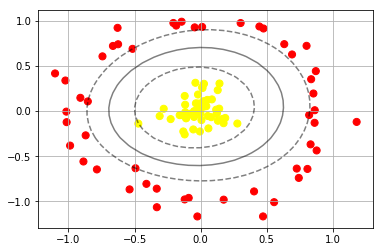

In [192]:
plt.scatter(X[:, 0], X[:, 1], c=y, s=50, cmap='autumn')
plot_svc_decision_function(clf)
plt.grid(True)

Sprawdzmy jeszcze jak radzi sobie SVM z danymi użytymi na samym początku, obejmujących wage i wzrost osób.

In [239]:
from sklearn.preprocessing import LabelEncoder

In [204]:
data = read_csv("dataset/weight-height.csv")
data.columns = ['Gender', 'Weight', 'Height']

In [210]:
height = data["Height"].values
weight = data["Weight"].values

In [222]:
pair = np.array(list(zip(height, weight)))

In [253]:
model = SVC(kernel='linear', C=0.1)
model.fit(pair, data["Gender"])

SVC(C=0.1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
  kernel='linear', max_iter=-1, probability=False, random_state=None,
  shrinking=True, tol=0.001, verbose=False)

In [254]:
aa = LabelEncoder()

In [255]:
aa = aa.fit_transform(data["Gender"].values)

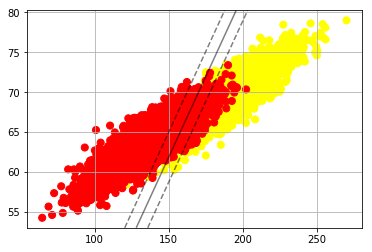

In [256]:
plt.scatter(pair[:, 0], pair[:, 1], c=aa, s=50, cmap='autumn')
plot_svc_decision_function(model)
plt.grid(True)

SVM służyć może do klasyfikacji jak i do regresji, i daje całkiem dobre wyniki dla skomplikowanych danych, głównie za pomocą wyboru właściwego kernela,
lecz zarazem wybór właściwego kernela jest najbardziej problematyczny.

 Moglibyśmy przeszukiwać wiele dostępnych nam jąder zapewnionych nam przez bibliotekę sklearn, ale to zapewnia nam duże zapotrzebowanie obliczeniowe, w szczególności gdy zbiór badanych punktów jest duży.

4. Neural Networks

In [ ]:
FFNN
pobierz dane
zaprezentuj dane
wyjasnij ax+b
wyjasnij podobienstwo do regresji liniowej
zbuduj model

RNN
pobierz dane
zaprezentuj dane
wyjasnij o co chodzi
zbuduj model

CNN
pobierz dane
zaprezentuj dane
wyjasnij o co chodzi
zbuduj model